In [15]:
%matplotlib inline

In [14]:
from datetime import datetime

import geopandas as gp
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import folium
from shapely.geometry import Point
from adjustText import adjust_text

In [9]:

path_to_zipfile = '2022-07-01_performance_fixed_tiles.zip'

# Read the shapefile zip file using geopandas
tiles = gp.read_file('zip://' + path_to_zipfile)

In [10]:
tiles.head()

,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,geometry
0,0022131321002111,75,97,959,1,1,"POLYGON ((-158.51624 71.73266, -158.51074 71.7..."
1,0022133222312322,15909,11930,96,17,3,"POLYGON ((-160.02686 70.64359, -160.02136 70.6..."
2,0022133222330032,1773,31968,33,1,1,"POLYGON ((-160.03784 70.63631, -160.03235 70.6..."
3,0022133222330033,10709,4902,91,1,1,"POLYGON ((-160.03235 70.63631, -160.02686 70.6..."
4,0022133222330100,13948,15680,98,23,4,"POLYGON ((-160.02686 70.64177, -160.02136 70.6..."


In [11]:

# Path to the GeoJSON file
path_to_geojson = 'Malaysia_admin2.geojson'

# Read the GeoJSON file using geopandas
states = gp.read_file(path_to_geojson)

# Print the first 5 rows of the dataframe
states.tail ()



,ID_0,ISO,NAME_0,ID_1,NAME_1,ID_2,NAME_2,VARNAME_2,NL_NAME_2,HASC_2,CC_2,TYPE_2,ENGTYPE_2,VALIDFR_2,VALIDTO_2,REMARKS_2,Shape_Leng,Shape_Area,geometry
155,158,MYS,Malaysia,1991,Trengganu,23132,Hulu Terengganu,None,None,MY.TE.HT,None,District,District,Unknown,Present,None,3.085499,0.316419,"MULTIPOLYGON (((102.60890 5.47062, 102.61250 5..."
156,158,MYS,Malaysia,1991,Trengganu,23133,Kemaman,None,None,MY.TE.KE,None,District,District,1947,Present,None,2.790317,0.204683,"MULTIPOLYGON (((103.45834 4.58544, 103.45853 4..."
157,158,MYS,Malaysia,1991,Trengganu,23134,Kuala Terengganu,None,None,MY.TE.KT,None,District,District,Unknown,Present,None,1.047597,0.046393,"MULTIPOLYGON (((103.04361 5.45472, 103.04444 5..."
158,158,MYS,Malaysia,1991,Trengganu,23135,Marang,None,None,MY.TE.MA,None,District,District,1947,Present,None,1.450292,0.054062,"MULTIPOLYGON (((103.26813 5.22729, 103.26826 5..."
159,158,MYS,Malaysia,1991,Trengganu,23136,Setiu,None,None,MY.TE.SE,None,District,District,Unknown,Present,None,2.604519,0.114171,"MULTIPOLYGON (((103.06451 5.59569, 103.06353 5..."


In [12]:
tiles_in_malaysia = gp.sjoin(tiles, states, how="inner", op='intersects')


C:\Users\User\AppData\Roaming\Python\Python39\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [13]:
print(tiles_in_malaysia)

                  quadkey  avg_d_kbps  avg_u_kbps  avg_lat_ms  tests  devices  \
5582743  1322213213231132       15850        5758          10      1        1   
5582744  1322213213231331        5381        5307          14     49       30   
5582745  1322213213231332       12236        8488          12     21       14   
5582746  1322213213231333        4239        4680          12     12       11   
5582747  1322213213302022      117285      106699           8     17        9   
...                   ...         ...         ...         ...    ...      ...   
5741991  1323230023031213       42786       25018          18      9        2   
5741992  1323230023031300       21639       18600          52      2        2   
5741993  1323230023033000      109268       53552          23      2        2   
5741994  1323230023033020       95519       55132          10      2        1   
5741995  1323230023210003        7643        7952          62      1        1   

                           

In [14]:
tiles_in_malaysia.to_csv("tiles_in_malaysia.csv", index=False)


In [15]:
# convert to Mbps for easier reading
tiles_in_malaysia['avg_d_mbps'] = tiles_in_malaysia['avg_d_kbps'] / 1000
tiles_in_malaysia['avg_u_mbps'] = tiles_in_malaysia['avg_u_kbps'] / 1000

In [16]:
tiles_in_malaysia.tail()

,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,geometry,index_right,ID_0,ISO,...,CC_2,TYPE_2,ENGTYPE_2,VALIDFR_2,VALIDTO_2,REMARKS_2,Shape_Leng,Shape_Area,avg_d_mbps,avg_u_mbps
5741991,1323230023031213,42786,25018,18,9,2,"POLYGON ((118.62488 4.45047, 118.63037 4.45047...",7,158,MYS,...,None,District,District,Unknown,Present,None,6.019846,0.094949,42.786,25.018
5741992,1323230023031300,21639,18600,52,2,2,"POLYGON ((118.63037 4.45595, 118.63586 4.45595...",7,158,MYS,...,None,District,District,Unknown,Present,None,6.019846,0.094949,21.639,18.600
5741993,1323230023033000,109268,53552,23,2,2,"POLYGON ((118.60840 4.43404, 118.61389 4.43404...",7,158,MYS,...,None,District,District,Unknown,Present,None,6.019846,0.094949,109.268,53.552
5741994,1323230023033020,95519,55132,10,2,1,"POLYGON ((118.60840 4.42309, 118.61389 4.42309...",7,158,MYS,...,None,District,District,Unknown,Present,None,6.019846,0.094949,95.519,55.132
5741995,1323230023210003,7643,7952,62,1,1,"POLYGON ((118.56995 4.38475, 118.57544 4.38475...",7,158,MYS,...,None,District,District,Unknown,Present,None,6.019846,0.094949,7.643,7.952


In [17]:
state_stats = (
    tiles_in_malaysia.groupby(["NAME_1", "NAME_2"])
    .apply(
        lambda x: pd.Series(
            {"avg_d_mbps_wt": np.average(x["avg_d_mbps"], weights=x["tests"])}
        )
    )
    .reset_index()
    .merge(
        tiles_in_malaysia.groupby(["NAME_1", "NAME_2"])
        .agg(tests=("tests", "sum"))
        .reset_index(),
        on=["NAME_1", "NAME_2"],
    )
)

In [18]:
table_stats = (
    state_stats.loc[state_stats["tests"] >= 50]
    .nlargest(20, "avg_d_mbps_wt")
    .append(
        state_stats.loc[state_stats["tests"] >= 50].nsmallest(20, "avg_d_mbps_wt")
    )
    .sort_values("avg_d_mbps_wt", ascending=False)
    .round(2) # round to 2 decimal places for easier reading
)

C:\Users\User\AppData\Local\Temp\ipykernel_20856\2598111866.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  state_stats.loc[state_stats["tests"] >= 50]


In [19]:
header = ["NAME_1", "NAME_2", "Avg download speed (Mbps)", "Tests"]

table_stats.rename(columns=dict(zip(table_stats.columns, header)))

,NAME_1,NAME_2,Avg download speed (Mbps),Tests
149,Selangor,Shah Alam,144.30,386956
141,Selangor,Gombak,139.46,64136
90,Sarawak,Bau,134.91,718
60,Pulau Pinang,Barat Daya,134.46,21090
64,Pulau Pinang,Timur Laut,134.12,46465
146,Selangor,Kuala Selangor,133.51,18490
142,Selangor,Hulu Langat,132.96,99242
144,Selangor,Klang,132.31,58556
75,Sabah,Papar,131.56,3591
1,Johor,Johor Baharu,127.29,111895


In [20]:
malaysia_data= states[['NAME_2', 'geometry']].merge(state_stats, on='NAME_2').to_crs(4236)

In [21]:
labels = ["0 to 25 Mbps", "25 to 50 Mbps", "50 to 100 Mbps", "100 to 150 Mbps", "150 to 200 Mbps"]

malaysia_data['group'] = pd.cut(
    malaysia_data.avg_d_mbps_wt, 
    (0, 25, 50, 100, 150, 200), 
    right=False, 
    labels = labels
)

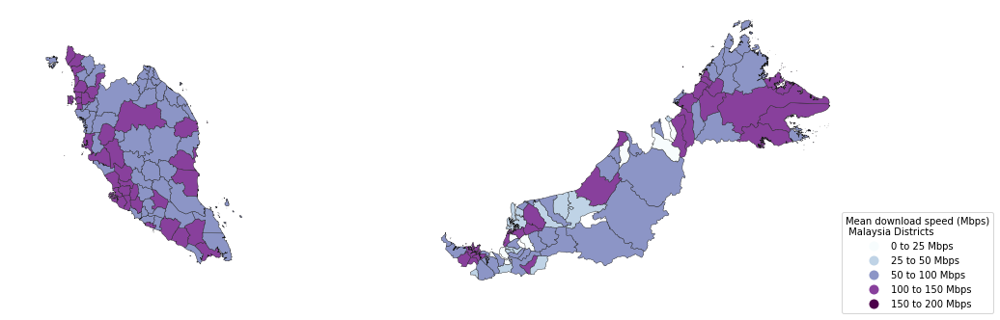

In [22]:
# Plot the map
fig, ax = plt.subplots(1, figsize=(16, 6))
malaysia_data.plot(
    column="group", cmap="BuPu", linewidth=0.4, ax=ax, edgecolor="0.1", legend=True
)
ax.axis("off")

# Set the legend
leg = ax.get_legend()
leg.set_bbox_to_anchor((1.15, 0.3))
leg.set_title("Mean download speed (Mbps)\n Malaysia Districts")

In [23]:
# Load the GeoJSON file for the boundaries of Kuala Lumpur
kuala_lumpur = gp.read_file('kuala_lumpur.geojson')

kuala_lumpur.head()

,id,fid,geometry
0,br730dc4071.1,0,"MULTIPOLYGON (((101.47947 3.39363, 101.48004 3..."


In [24]:
tiles_in_lumpur = gp.sjoin(tiles, kuala_lumpur, how="inner", op='intersects')


C:\Users\User\AppData\Roaming\Python\Python39\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [32]:
tiles_in_lumpur['avg_d_mbps'] = tiles_in_lumpur['avg_d_kbps'] / 1000
tiles_in_lumpur['avg_u_mbps'] = tiles_in_lumpur['avg_u_kbps'] / 1000

In [33]:
# tiles_in_lumpur.to_csv("tiles_in_lumpur.csv", index=False)
tiles_in_lumpur.to_file("tiles_in_lumpur.geojson", driver='GeoJSON')


In [34]:
tiles_in_lumpur.head()

,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,geometry,index_right,id,fid,avg_d_mbps,avg_u_mbps
5641544,1322320220123331,99952,36107,5,15,9,"POLYGON ((101.50818 3.34892, 101.51367 3.34892...",0,br730dc4071.1,0,99.952,36.107
5641545,1322320220123333,132464,55631,5,73,29,"POLYGON ((101.50818 3.34344, 101.51367 3.34344...",0,br730dc4071.1,0,132.464,55.631
5641614,1322320220132220,62481,31728,4,6,2,"POLYGON ((101.51367 3.34892, 101.51917 3.34892...",0,br730dc4071.1,0,62.481,31.728
5641615,1322320220132221,123591,56780,6,144,10,"POLYGON ((101.51917 3.34892, 101.52466 3.34892...",0,br730dc4071.1,0,123.591,56.780
5641616,1322320220132222,162703,58113,7,223,47,"POLYGON ((101.51367 3.34344, 101.51917 3.34344...",0,br730dc4071.1,0,162.703,58.113


In [16]:
from shapely.geometry import Polygon
from shapely.wkt import loads

# Read in the GeoJSON file as a GeoDataFrame
gdf = gp.read_file('tiles_in_lumpur.geojson')

In [17]:

gdf['geometry'] = gdf['geometry'].astype(str)

# Convert the geometry column to valid geometries
gdf['geometry'] = gdf['geometry'].apply(loads)

gdf.set_crs(epsg=4326, inplace=True)

# Check which geometries are valid
valid_geom = gdf['geometry'].is_valid

# Create a new GeoDataFrame with only the rows that have valid geometries
clean_gdf = gdf[valid_geom]


print(clean_gdf.geom_type.unique())


c:\Anaconda3\lib\site-packages\geopandas\geodataframe.py:1442: UserWarning: Geometry column does not contain geometry.
  warnings.warn("Geometry column does not contain geometry.")


['Polygon']


In [18]:

# # Set the CRS for the GeoDataFrame
# clean_gdf.set_crs(epsg=4326, inplace=True)

# # Create the Folium map centered on Kuala Lumpur
# m = folium.Map(location=[3.1390, 101.6869], zoom_start=11)

# # Add the GeoJSON data to the map
# folium.GeoJson(clean_gdf).add_to(m)

# # Show the map
# m


from folium.plugins import HeatMap
clean_gdf['Latitude'] = clean_gdf.geometry.centroid.y
clean_gdf['Longitude'] = clean_gdf.geometry.centroid.x



clean_gdf.head()


C:\Users\User\AppData\Local\Temp\ipykernel_6532\526818000.py:15: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  clean_gdf['Latitude'] = clean_gdf.geometry.centroid.y
C:\Users\User\AppData\Local\Temp\ipykernel_6532\526818000.py:16: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  clean_gdf['Longitude'] = clean_gdf.geometry.centroid.x


,quadkey,avg_d_kbps,avg_u_kbps,avg_lat_ms,tests,devices,index_right,id,fid,avg_d_mbps,avg_u_mbps,geometry,Latitude,Longitude
0,1322320220123331,99952,36107,5,15,9,0,br730dc4071.1,0,99.952,36.107,"POLYGON ((101.50818 3.34892, 101.51367 3.34892...",3.346180,101.510925
1,1322320220123333,132464,55631,5,73,29,0,br730dc4071.1,0,132.464,55.631,"POLYGON ((101.50818 3.34344, 101.51367 3.34344...",3.340696,101.510925
2,1322320220132220,62481,31728,4,6,2,0,br730dc4071.1,0,62.481,31.728,"POLYGON ((101.51367 3.34892, 101.51917 3.34892...",3.346180,101.516418
3,1322320220132221,123591,56780,6,144,10,0,br730dc4071.1,0,123.591,56.780,"POLYGON ((101.51917 3.34892, 101.52466 3.34892...",3.346180,101.521912
4,1322320220132222,162703,58113,7,223,47,0,br730dc4071.1,0,162.703,58.113,"POLYGON ((101.51367 3.34344, 101.51917 3.34344...",3.340696,101.516418


In [19]:
# Create a new DataFrame with just the latitude, longitude, and value columns
data = clean_gdf.loc[:, ['Latitude', 'Longitude', 'avg_d_mbps', 'avg_u_mbps']]


In [24]:
from branca.colormap import linear
print(dir(linear))


['Accent_03', 'Accent_04', 'Accent_05', 'Accent_06', 'Accent_07', 'Accent_08', 'Blues_03', 'Blues_04', 'Blues_05', 'Blues_06', 'Blues_07', 'Blues_08', 'Blues_09', 'BrBG_03', 'BrBG_04', 'BrBG_05', 'BrBG_06', 'BrBG_07', 'BrBG_08', 'BrBG_09', 'BrBG_10', 'BrBG_11', 'BuGn_03', 'BuGn_04', 'BuGn_05', 'BuGn_06', 'BuGn_07', 'BuGn_08', 'BuGn_09', 'BuPu_03', 'BuPu_04', 'BuPu_05', 'BuPu_06', 'BuPu_07', 'BuPu_08', 'BuPu_09', 'Dark2_03', 'Dark2_04', 'Dark2_05', 'Dark2_06', 'Dark2_07', 'Dark2_08', 'GnBu_03', 'GnBu_04', 'GnBu_05', 'GnBu_06', 'GnBu_07', 'GnBu_08', 'GnBu_09', 'Greens_03', 'Greens_04', 'Greens_05', 'Greens_06', 'Greens_07', 'Greens_08', 'Greens_09', 'Greys_03', 'Greys_04', 'Greys_05', 'Greys_06', 'Greys_07', 'Greys_08', 'Greys_09', 'OrRd_03', 'OrRd_04', 'OrRd_05', 'OrRd_06', 'OrRd_07', 'OrRd_08', 'OrRd_09', 'Oranges_03', 'Oranges_04', 'Oranges_05', 'Oranges_06', 'Oranges_07', 'Oranges_08', 'Oranges_09', 'PRGn_03', 'PRGn_04', 'PRGn_05', 'PRGn_06', 'PRGn_07', 'PRGn_08', 'PRGn_09', 'PRGn_10

In [29]:

# Define color scales for download and upload speeds
download_scale = linear.RdYlGn_10.scale(vmin=0, vmax=100)
upload_scale = linear.PuBu_09.scale(vmin=0, vmax=100)

# Create the map
kl_map = folium.Map(location=[3.1390, 101.6869], zoom_start=12)

# Create the scatter plot layer for download speed
d_scatter = folium.plugins.MarkerCluster().add_to(kl_map)
for _, row in data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=10,
        weight=2,
        fill=True,
        fill_opacity=0.5,
        fill_color=download_scale(row['avg_d_mbps']),
        color='black',
        tooltip=f"Download speed: {row['avg_d_mbps']:.2f} Mbps"
    ).add_to(d_scatter)

# Create the scatter plot layer for upload speed
u_scatter = folium.plugins.MarkerCluster().add_to(kl_map)
for _, row in data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=10,
        weight=2,
        fill=True,
        fill_opacity=0.5,
        fill_color=upload_scale(row['avg_u_mbps']),
        color='orange',
        tooltip=f"Upload speed: {row['avg_u_mbps']:.2f} Mbps"
    ).add_to(u_scatter)

# Display the map
kl_map


In [26]:
import folium
import geopandas as gpd

# Load GeoJSON file
gdf = gpd.read_file('tiles_in_lumpur.geojson')

# Get the centroid of the GeoDataFrame
center = gdf.centroid.iloc[0]

# Create the map
m = folium.Map(location=[center.y, center.x], zoom_start=10)

# Add GeoJSON layer
folium.GeoJson(gdf).add_to(m)

# Show the map
m


C:\Users\User\AppData\Local\Temp\ipykernel_6532\946129927.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = gdf.centroid.iloc[0]


In [ ]:

df = pd.read_csv('tiles_in_lumpur.csv')

# Filter data to Kuala Lumpur tiles
kl_df = df[df['quadkey'].str.startswith('1320')]

# Create a new DataFrame with just the latitude, longitude, and value columns
data = kl_df.loc[:, ['Latitude', 'Longitude', 'avg_d_mbps', 'avg_u_mbps']]

# Create the map
kl_map = folium.Map(location=[3.1390, 101.6869], zoom_start=12)

# Define the color scheme for the gradient
color_scale = folium.utilities.linear_gradient('#FF0000', '#00FF00', vmin=0, vmax=100)

# Create the scatter plot layer for download speed
d_scatter = folium.plugins.MarkerCluster().add_to(kl_map)
for _, row in data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        weight=1,
        fill=True,
        fill_opacity=0.5,
        fill_color=color_scale(row['avg_d_mbps']),
        color=None,
        tooltip=f"Download speed: {row['avg_d_mbps']:.2f} Mbps"
    ).add_to(d_scatter)

# Create the scatter plot layer for upload speed
u_scatter = folium.plugins.MarkerCluster().add_to(kl_map)
for _, row in data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        weight=1,
        fill=True,
        fill_opacity=0.5,
        fill_color=color_scale(row['avg_u_mbps']),
        color=None,
        tooltip=f"Upload speed: {row['avg_u_mbps']:.2f} Mbps"
    ).add_to(u_scatter)

# Display the map
kl_map


In [2]:





# #Create the map and heatmap layer
# map = folium.Map(location=[3.1390, 101.6869], zoom_start=12)
# heatmap_layer = HeatMap(data=data, radius=15, blur=10)

# # Add the heatmap layer to the map
# heatmap_layer.add_to(map)

# # Display the map
# map





# # Create the map and heatmap layer
# map = folium.Map(location=[3.1390, 101.6869], zoom_start=12)
# heatmap_data = clean_gdf.loc[:, ['Latitude', 'Longitude', 'avg_d_mbps', 'avg_u_mbps']].values.tolist()
# heatmap_layer = HeatMap(data=heatmap_data, radius=1000, blur=5, gradient={.4: 'blue', .65: 'lime', 1: 'red'})

# # Add the heatmap layer to the map
# heatmap_layer.add_to(map)

# # Display the map
# map

# # Create the map and heatmap layer
# map = folium.Map(location=[3.1390, 101.6869], zoom_start=12)
# heatmap_layer = HeatMap(data=data, radius=25, blur=15)

# # heatmap_layer = HeatMap(data=data, radius=15, blur=10)

# # Add the heatmap layer to the map
# heatmap_layer.add_to(map)
# # Save the map as an HTML file
# map.save("heatmap.html")


NameError: name 'HeatMap' is not defined

In [1]:
import folium

# Create the map
m = folium.Map(location=[3.1390, 101.6869], zoom_start=12)

# Define the data
latitudes = [3.1390, 3.1631, 3.1390, 3.0854, 3.0604]
longitudes = [101.6869, 101.6504, 101.6869, 101.7414, 101.6774]
values = [2.34, 4.56, 3.21, 1.23, 5.67]

# Create a feature group for the scatter plot
scatter = folium.FeatureGroup(name='Scatter Plot')

# Loop through the data and add markers to the feature group
for lat, lon, val in zip(latitudes, longitudes, values):
    marker = folium.Marker(location=[lat, lon], 
                           popup=str(val), 
                           icon=folium.Icon(color='red', icon='info-sign'))
    scatter.add_child(marker)

# Add the feature group to the map
m.add_child(scatter)

# Add a layer control to the map
folium.LayerControl().add_to(m)

# Display the map
m
